In [2]:
# Matplotlib forms basis for visualization in Python
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

# We will use the Seaborn library
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"
df = pd.read_csv(DATA_URL + "telecom_churn.csv")

df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


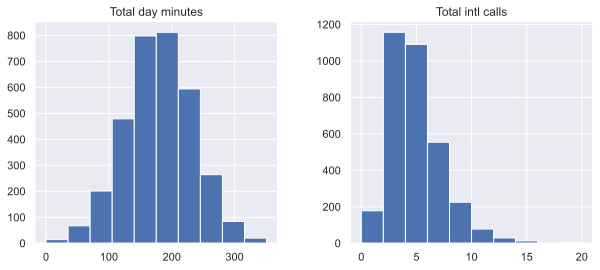

In [3]:
features = ["Total day minutes", "Total intl calls"]
df[features].hist(figsize=(10, 4));

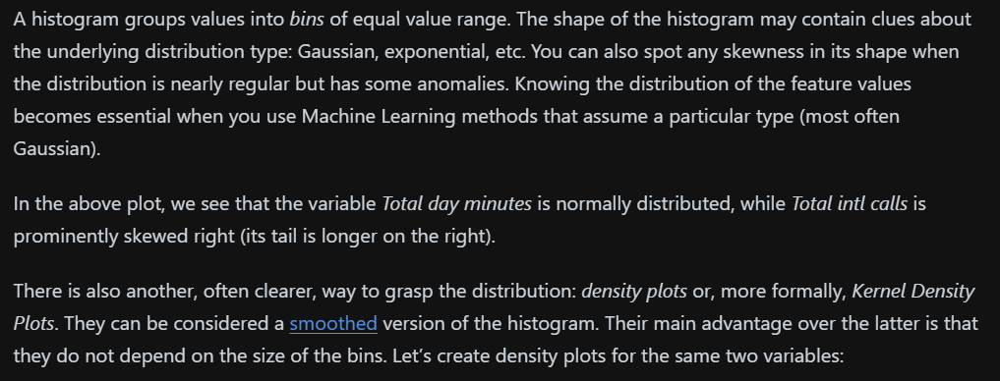

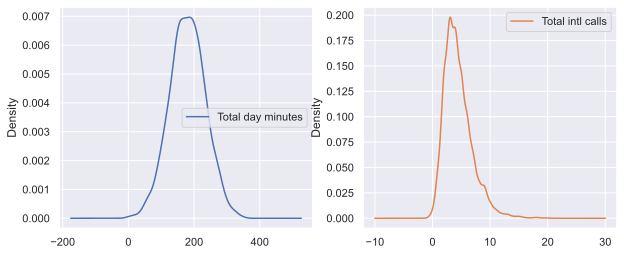

In [4]:
#density plots
df[features].plot(kind="density", subplots=True, layout=(1, 2), sharex=False, figsize=(10, 4));

c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


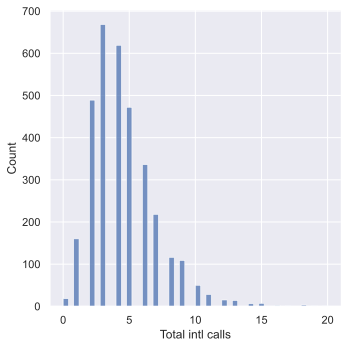

In [5]:
#It is also possible to plot a distribution of observations with seaborn’s distplot();

#replace infite values with Na
#pd.option_context('mode.use_inf_as_na', True):
df.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.displot(df["Total intl calls"]);

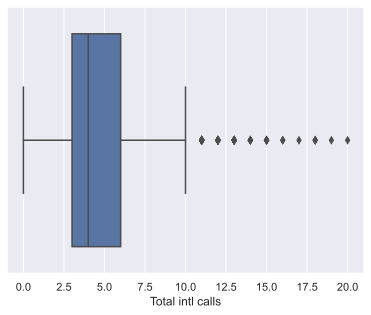

In [6]:
#Box plot
#Another useful type of visualization is a box plot. seaborn does a great job here:

sns.boxplot(x="Total intl calls", data=df);

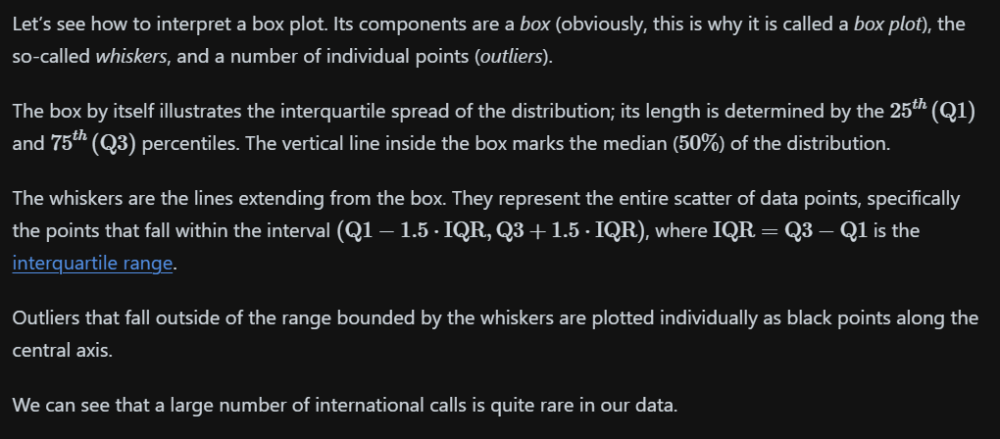

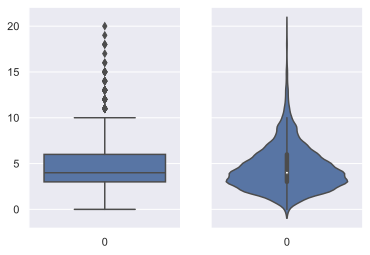

In [7]:
#Violin plot

_, axes = plt.subplots(1, 2, sharey=True, figsize=(6, 4))  #subplots(nrows=1, ncols=1, *, sharex=False, sharey=False,
#squeeze=True, width_ratios=None, height_ratios=None, subplot_kw=None, gridspec_kw=None, **fig_kw)

sns.boxplot(data=df["Total intl calls"], ax=axes[0])
sns.violinplot(data=df["Total intl calls"], ax=axes[1]);

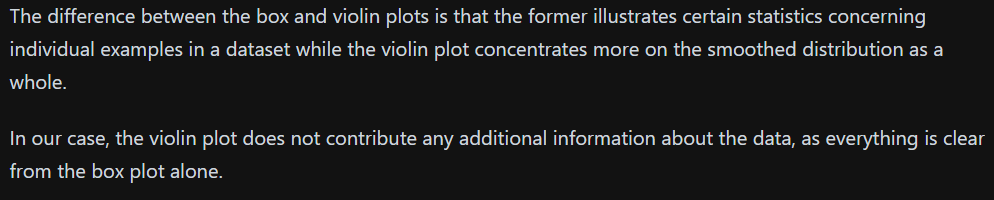

In [8]:
df[features].describe()

,Total day minutes,Total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


In [9]:
#Frequency table

#Let’s check the class balance in our dataset by looking at the distribution of the target variable: the churn rate. 
#First, we will get a frequency table, which shows how frequent each value of the categorical variable is. 
#For this, we will use the value_counts() method:

df["Churn"].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

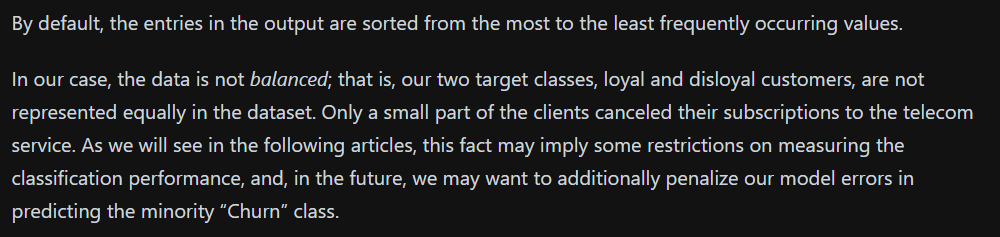

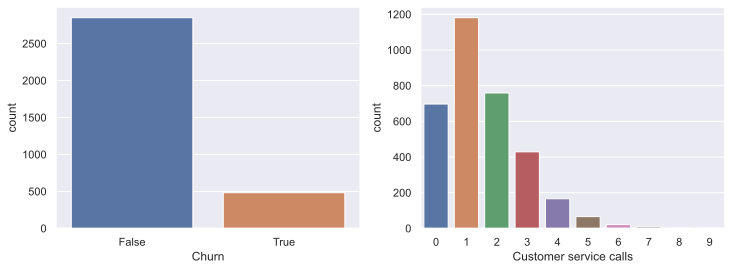

In [10]:
#Bar plot

#The bar plot is a graphical representation of the frequency table. 
#The easiest way to create it is to use the seaborn’s function countplot(). 
#There is another function in seaborn that is somewhat confusingly called barplot() 
#and is mostly used for representation of some basic statistics of a numerical variable grouped by a categorical feature.

_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

sns.countplot(x="Churn", data=df, ax=axes[0])
sns.countplot(x="Customer service calls", data=df, ax=axes[1]);

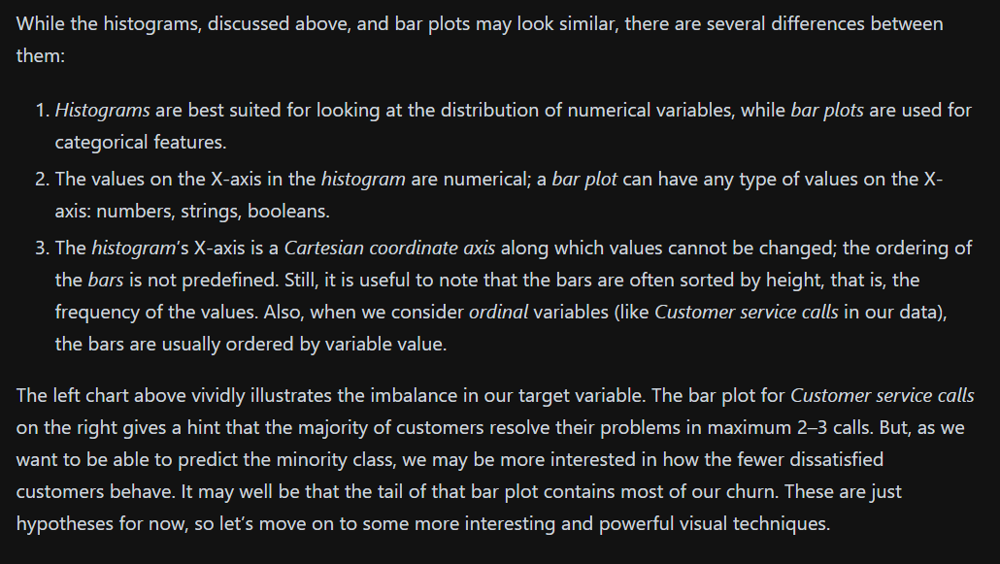

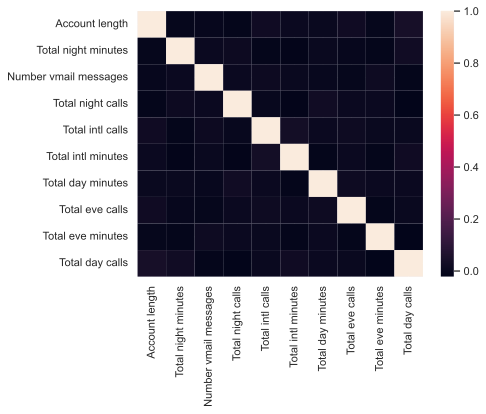

In [11]:
#3. Multivariate visualization

#Multivariate plots allow us to see relationships between two and more different variables, all in one figure. 
#Just as in the case of univariate plots, the specific type of visualization will depend on the types of 
#the variables being analyzed.


# 3.1 Quantitative vs. Quantitative

#First, we will use the method corr() on a DataFrame that calculates the correlation between each pair of features. 
#Then, we pass the resulting correlation matrix to heatmap() from seaborn,
#which renders a color-coded matrix for the provided values:

# Drop non-numerical variables
numerical = list(set(df.columns)- set(
        [
            "State",
            "International plan",
            "Voice mail plan",
            "Area code",
            "Churn",
            "Customer service calls",
        ]
    )
)
numerical

numerical = list(
    set(numerical)
    - set(
        [
            "Total day charge",
            "Total eve charge",
            "Total night charge",
            "Total intl charge",
        ]
    )
)

# Calculate and plot

corr_matrix = df[numerical].corr()
sns.heatmap(corr_matrix);

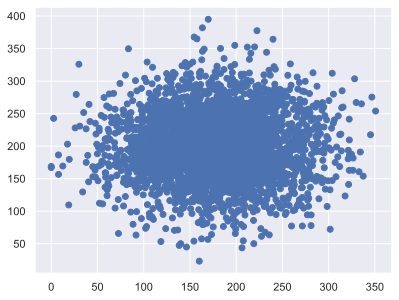

In [12]:
#Scatter plot

#The scatter plot displays values of two numerical variables as Cartesian coordinates in 2D space. 
#Scatter plots in 3D are also possible.

#Let’s try out the function scatter() from the matplotlib library:
plt.scatter(df["Total day minutes"], df["Total night minutes"]);


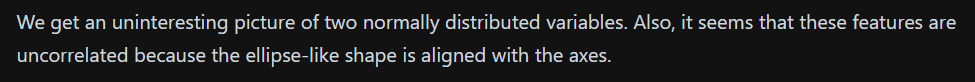

c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


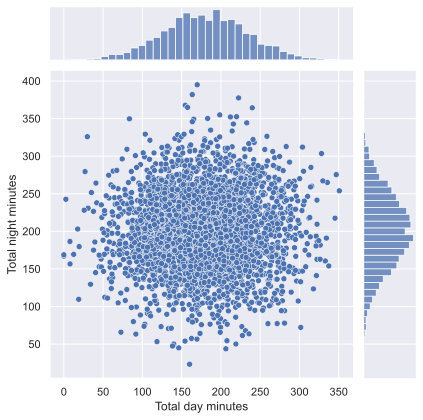

In [13]:
#There is a slightly fancier option to create a scatter plot with the seaborn library:

df.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x="Total day minutes", y="Total night minutes", data=df, kind="scatter");

c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

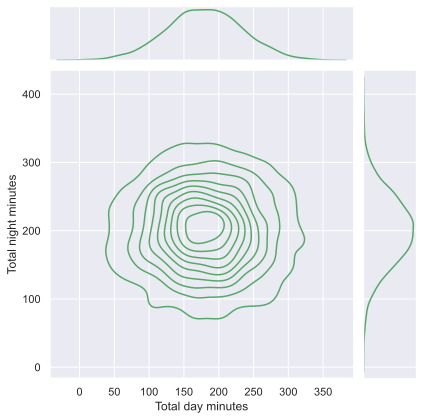

In [14]:
#Using the same function, we can also get a smoothed version of our bivariate distribution:

sns.jointplot(x="Total day minutes", y="Total night minutes", data=df, kind="kde", color="g");

c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mateu\anaconda3\envs\test2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

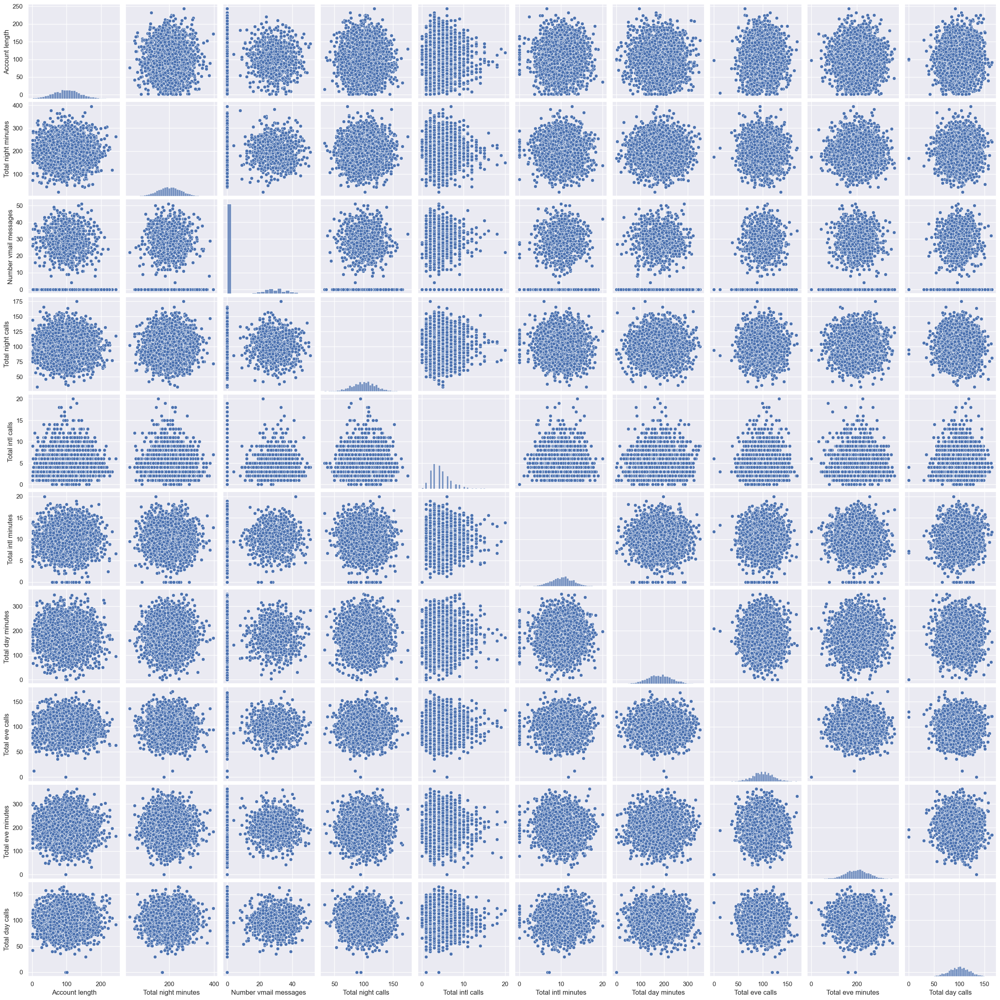

In [15]:
#Scatterplot matrix

# `pairplot()` may become very slow with the SVG format
%config InlineBackend.figure_format = 'png'

sns.pairplot(df[numerical]);

In [16]:
%config InlineBackend.figure_format = 'svg'

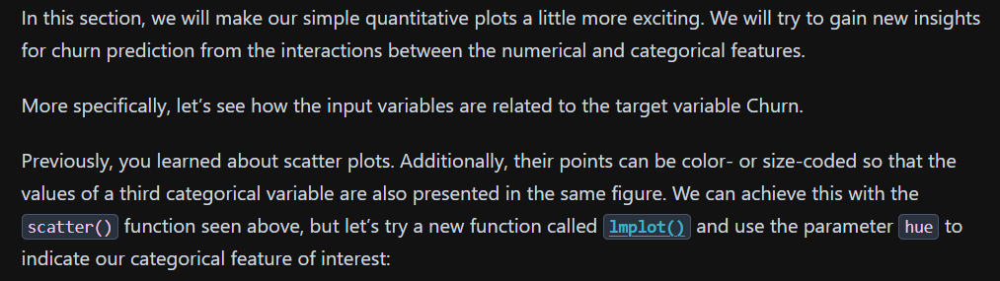

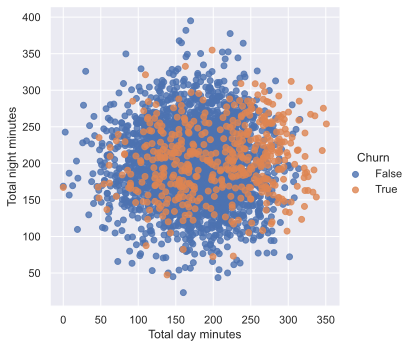

In [17]:
#3.2 Quantitative vs. Categorical

sns.lmplot(x="Total day minutes", y="Total night minutes", data=df, hue="Churn", fit_reg=False);

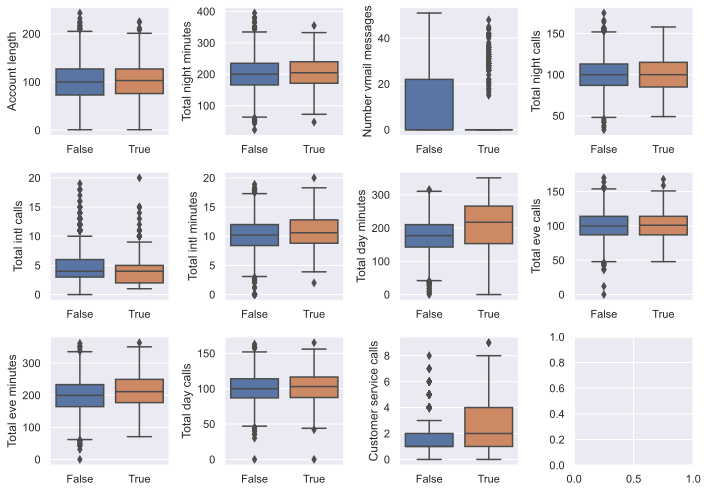

In [18]:
#Now, let’s create box plots to visualize the distribution statistics of the numerical variables in two disjoint groups: 
#the loyal customers (Churn=False) and those who left (Churn=True).

# Sometimes you can analyze an ordinal variable just as numerical one
numerical.append("Customer service calls")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7))
for idx, feat in enumerate(numerical):
    ax = axes[int(idx / 4), idx % 4]
    sns.boxplot(x="Churn", y=feat, data=df, ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel(feat)
fig.tight_layout();

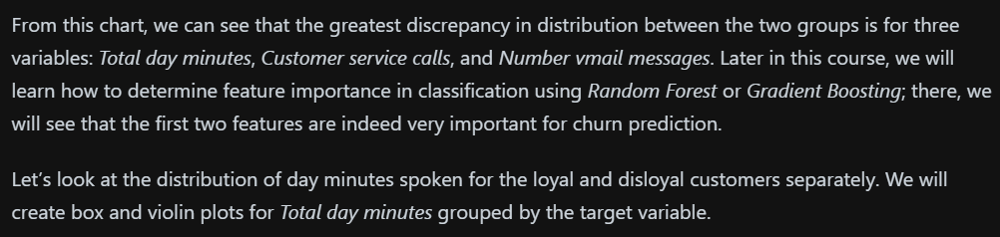

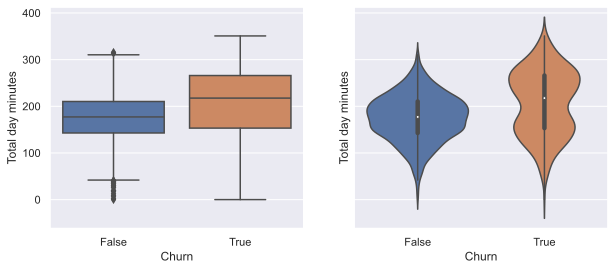

In [19]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.boxplot(x="Churn", y="Total day minutes", data=df, ax=axes[0])
sns.violinplot(x="Churn", y="Total day minutes", data=df, ax=axes[1]);

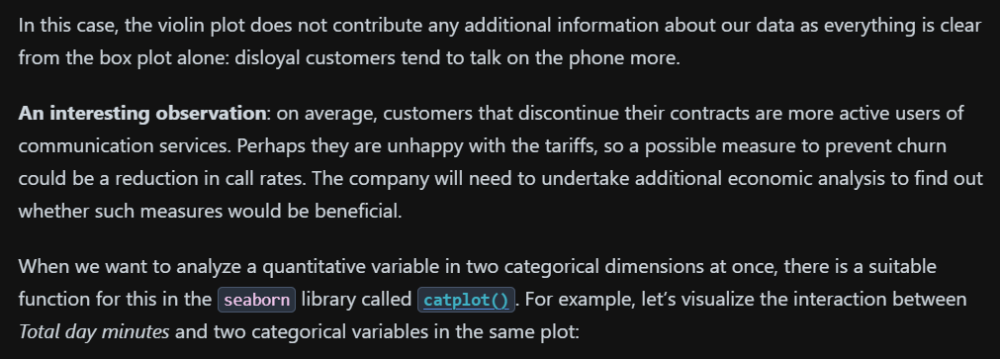

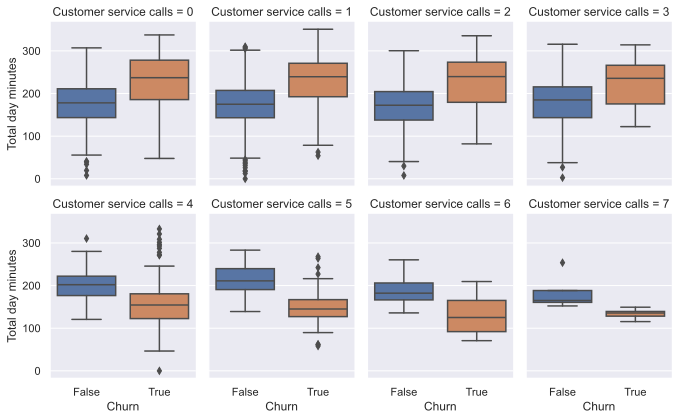

In [20]:
#let’s visualize the interaction between Total day minutes and two categorical variables in the same plot:

sns.catplot(
    x="Churn",
    y="Total day minutes",
    col="Customer service calls",
    data=df[df["Customer service calls"] < 8],
    kind="box",
    col_wrap=4,
    height=3,
    aspect=0.8,
);

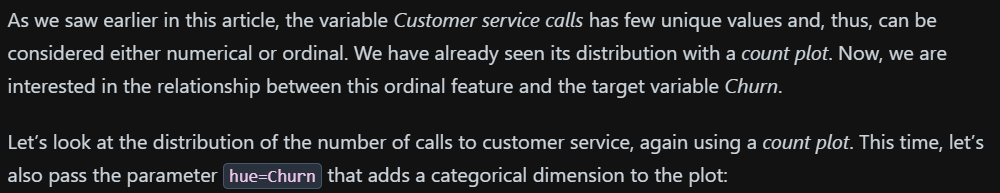

<Axes: xlabel='Customer service calls', ylabel='count'>

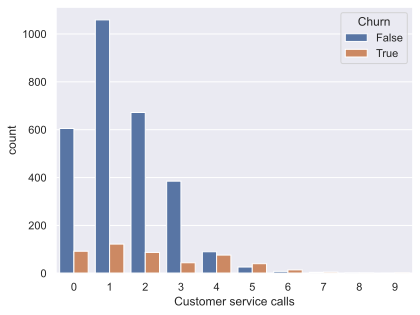

In [21]:
#3.3 Categorical vs. Categorical

sns.countplot( x="Customer service calls", hue=df["Churn"].astype("str"), data=df)

In [22]:
#_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

#sns.countplot(x="International plan", hue="Churn", data=df, ax=axes[0])
#sns.countplot(x="Voice mail plan", hue="Churn", data=df, ax=axes[1]);

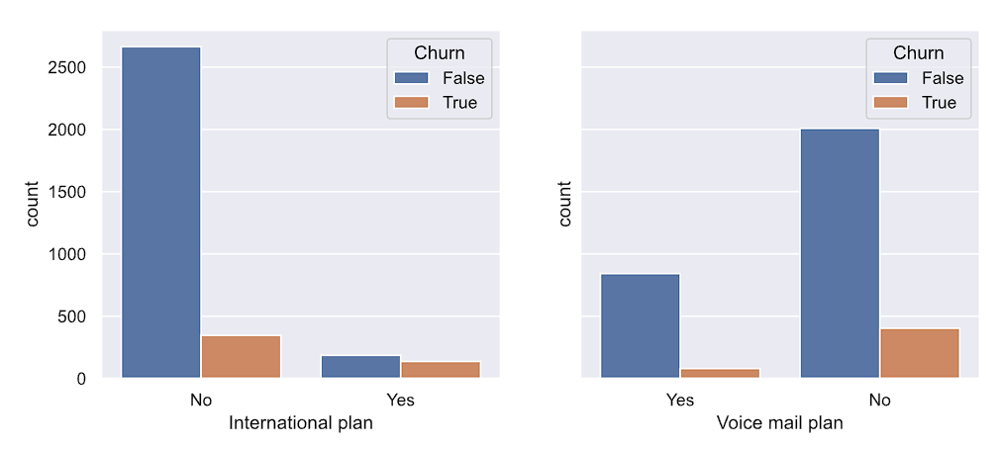

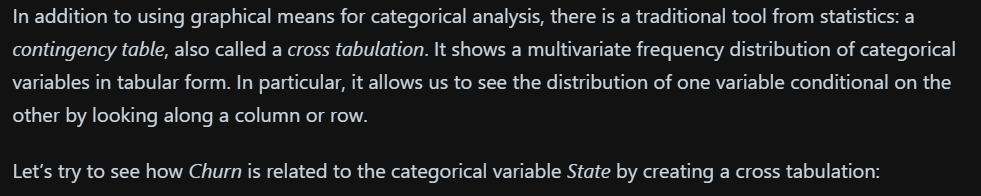

In [23]:
#Contingency table

#Let’s try to see how Churn is related to the categorical variable State by creating a cross tabulation:

pd.crosstab(df["State"], df["Churn"]).T

State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,
False,49,72,44,60,25,57,62,49,52,55,...,52,48,54,62,72,65,52,71,96,68
True,3,8,11,4,9,9,12,5,9,8,...,8,5,18,10,5,8,14,7,10,9


In [24]:
df.groupby(["State"])["Churn"].agg(["mean"]).sort_values(by="mean", ascending=False).T

State,NJ,CA,TX,MD,SC,MI,MS,NV,WA,ME,...,RI,WI,IL,NE,LA,IA,VA,AZ,AK,HI
mean,0.264706,0.264706,0.25,0.242857,0.233333,0.219178,0.215385,0.212121,0.212121,0.209677,...,0.092308,0.089744,0.086207,0.081967,0.078431,0.068182,0.064935,0.0625,0.057692,0.056604


In [25]:
#4. Whole dataset visualizations

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

#We will leave out the State and Churn features and convert the values “Yes”/”No” of the binary features
#into numerical values using pandas.Series.map():

X = df.drop(["Churn", "State"], axis=1)
X["International plan"] = X["International plan"].map({"Yes": 1, "No": 0})
X["Voice mail plan"] = X["Voice mail plan"].map({"Yes": 1, "No": 0})

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



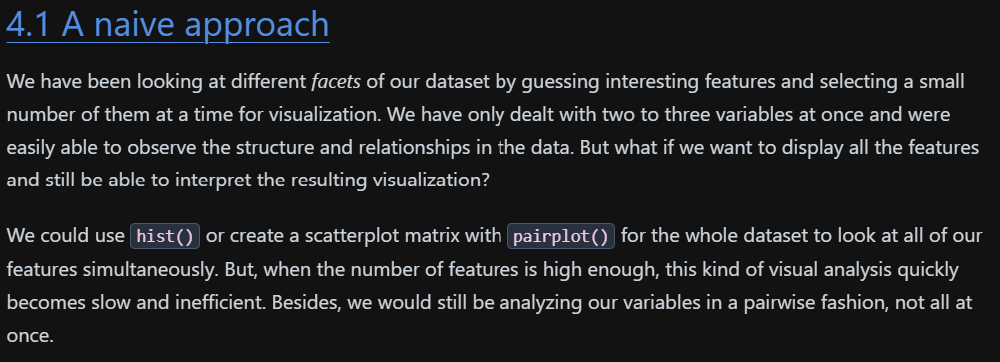

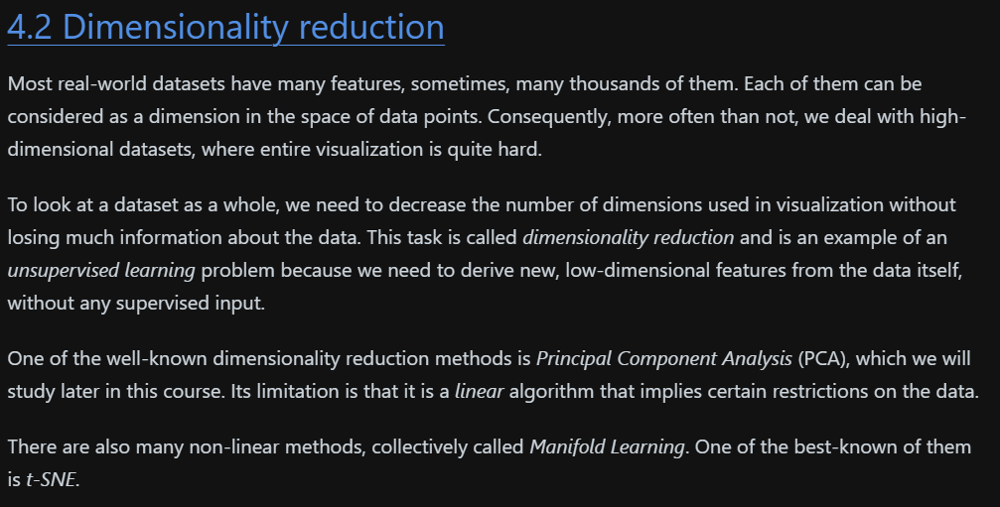

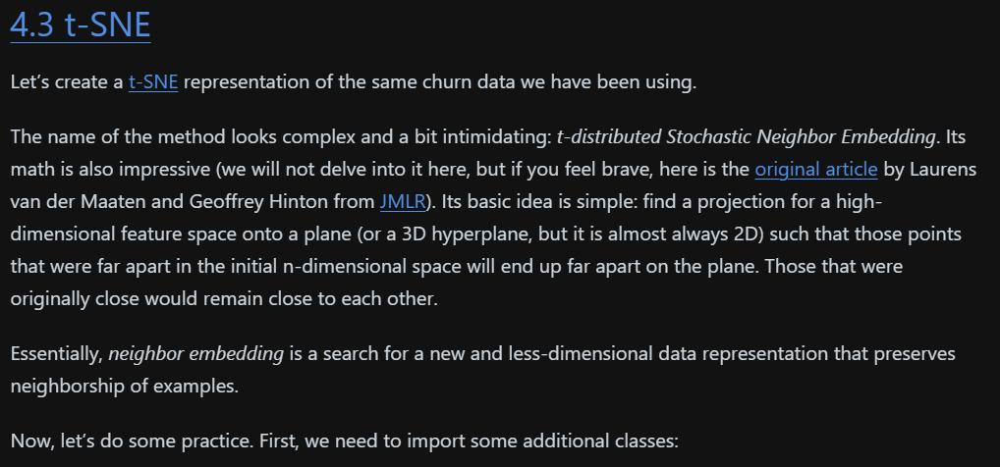

CPU times: total: 1min 36s
Wall time: 11.5 s


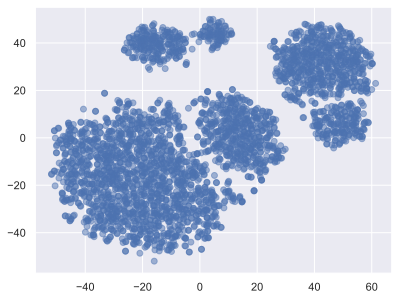

In [26]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5);

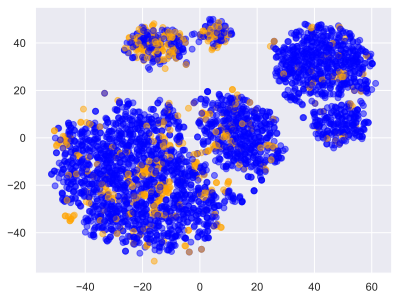

In [27]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=df["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

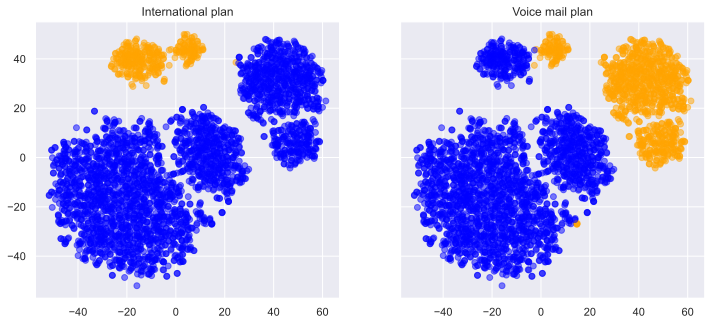

In [28]:
#To better understand the picture, we can also color it with the remaining binary features: 
#International Plan and Voicemail. Orange dots here indicate instances that are positive for the corresponding binary feature.

_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=df[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);

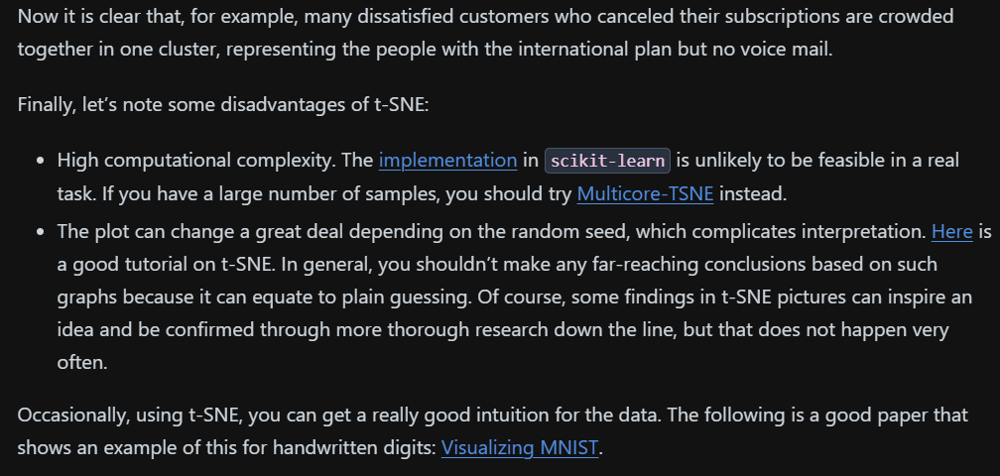

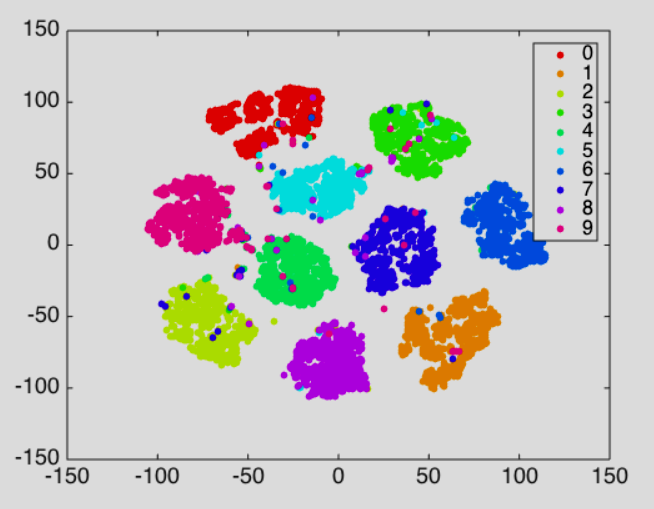